## Import Libraries
The code used to implement the TD3 agent is taken from here: https://github.com/higgsfield/RL-Adventure-2.

In [1]:
import math
import random
import time
import pandas as pd

from matplotlib import animation
from matplotlib.animation import FuncAnimation, PillowWriter 

import gym
import numpy as np

import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.distributions import Normal

from IPython.display import clear_output
import matplotlib.pyplot as plt
%matplotlib inline

use_cuda = torch.cuda.is_available()
device   = torch.device("cuda" if use_cuda else "cpu")
use_cuda

False

## Plot Functions

In [2]:
plt.rcParams.update({'font.size': 18})
def plot_rewards(rewards):
    plt.plot(range(len(rewards)), rewards)
    plt.xlabel("Episodes")
    plt.ylabel("Rewards")
    plt.show()
    plt.close()

def plot_smoothed(rewards, a):
    rewards_ema = pd.DataFrame(rewards).ewm(alpha = a).mean()
    plt.rcParams['figure.figsize'] = [10, 7]
    plt.plot(rewards_ema)
    plt.xlabel("Episodes")
    plt.ylabel("Rewards (EMA)")
    plt.show()
    plt.close()
    
def graph_policy(policy, n, title, is_policy = True, value_net = None, filename = None):
    # Create grid for angular velocity
    ang_vel = np.linspace(-8, 8, num = n)
    ang_vel = np.expand_dims(ang_vel, axis = 1)
    # Create grid of angle (theta)
    theta_grid = np.linspace(0, 2 * math.pi, num = n)
    magnitude = []
    for i in range(n):
        for j in range(n):
            # Convert theta to x-y coordinates
            x_val = np.cos(theta_grid[j])
            y_val = np.sin(theta_grid[j])
            # Create input for policy: (x, y, angular velocity)
            inputs = np.array([x_val, y_val, ang_vel[i][0]], dtype = np.float32)
            action_taken = policy.get_action(inputs)
            # If plotting the policy function
            if is_policy:
                # Append action to list
                magnitude.append(action_taken)
            # If plotting the value function
            else:
                temp1 = torch.FloatTensor(inputs).unsqueeze(0).to(device)
                temp2 = torch.FloatTensor(action_taken).unsqueeze(0).to(device)
                # Value function takes in both state and action
                value = value_net(temp1, temp2).detach().cpu().numpy()
                magnitude.append(value)
    # Convert list to n by n matrix
    magnitude = np.array(magnitude)
    magnitude = magnitude.reshape(n, n)
    # Converts angle and angular velocity arrays to n by n matrices
    # Note that each element in the matrix magnitude is calculated
    # from the corresponding angle and angular velocity from X and Y, respectively
    X, Y = np.meshgrid(theta_grid, ang_vel)    
    if is_policy:
        plt.scatter(X, Y, c = magnitude, cmap = plt.get_cmap('Wistia'), vmin = -2, vmax = 2)
        plt.colorbar(label = 'Action')
    else:
        plt.scatter(X, Y, c = magnitude, cmap = plt.get_cmap('Blues'))
        plt.colorbar(label = 'Value')
    plt.title(title)
    plt.axhline(y=0, color='k')
    plt.axvline(x=0, color='k')
    plt.xlabel("Angle")
    plt.ylabel("Angular Velocity")
    plt.ylim(-8, 8)
    fig = plt.gcf()
    fig.set_size_inches(16, 16)
    # plt.savefig(filename)
    plt.show()

## Save gifs of agent

In [3]:
def save_frames_as_gif(frames, path='./Visualizations/', filename='pendulum_gym_animation.gif'):

    #Mess with this to change frame size
    plt.figure(figsize=(frames[0].shape[1] / 72.0, frames[0].shape[0] / 72.0), dpi=72)

    patch = plt.imshow(frames[0])
    plt.axis('off')

    def animate(i):
        patch.set_data(frames[i])

    anim = animation.FuncAnimation(plt.gcf(), animate, frames = len(frames), interval=50)
    anim.save(path + filename, writer='pillow', fps= 120)

## Create log(cosh) loss

In [4]:
def log_cosh(x):
    return x + torch.nn.functional.softplus(-2. * x) - math.log(2.0)

def log_cosh_loss(y_pred, y_true):
    return torch.mean(log_cosh(y_pred - y_true))

class LogCoshLoss(torch.nn.Module):
    def __init__(self):
        super().__init__()

    def forward(self, y_pred, y_true):
        return log_cosh_loss(y_pred, y_true)

## Replay Buffer

In [5]:
class ReplayBuffer:
    def __init__(self, capacity):
        self.capacity = capacity
        self.buffer = []
        self.position = 0
    
    def push(self, state, action, reward, next_state, done):
        # Add space in buffer to add next tuple
        if len(self.buffer) < self.capacity:
            self.buffer.append(None)
        # Add tuple to buffer
        self.buffer[self.position] = (state, action, reward, next_state, done)
        # Cycle index to beginning once buffer is full
        self.position = (self.position + 1) % self.capacity
    
    def sample(self, batch_size):
        batch = random.sample(self.buffer, batch_size)
        # Creates a tuple of 5 elements: states, actions, ...., dones
        # Each element is an array of length = batch_size
        # i.e. first element is an array of states, second is an array of actions, etc
        state, action, reward, next_state, done = map(np.stack, zip(*batch))
        return state, action, reward, next_state, done
    
    def __len__(self):
        return len(self.buffer)

## Normalize action space

In [6]:
class NormalizedActions(gym.ActionWrapper):

    def action(self, action):
        low_bound   = self.action_space.low
        upper_bound = self.action_space.high
        
        action = low_bound + (action + 1.0) * 0.5 * (upper_bound - low_bound)
        action = np.clip(action, low_bound, upper_bound)
        
        return action

    def reverse_action(self, action):
        low_bound   = self.action_space.low
        upper_bound = self.action_space.high
        
        action = 2 * (action - low_bound) / (upper_bound - low_bound) - 1
        action = np.clip(action, low_bound, upper_bound)
        
        return action

## Gaussian Noise

In [7]:
class GaussianExploration(object):
    def __init__(self, action_space, max_sigma=1.0, min_sigma=1.0, decay_period=1000000):
        self.low  = action_space.low
        self.high = action_space.high
        self.max_sigma = max_sigma
        self.min_sigma = min_sigma
        self.decay_period = decay_period
    
    def get_action(self, action, t=0):
        sigma  = self.max_sigma - (self.max_sigma - self.min_sigma) * min(1.0, t / self.decay_period)
        action = action + np.random.normal(size=len(action)) * sigma
        # Output: array([action])
        return np.clip(action, self.low, self.high)

## Soft Update Function for Targets

In [8]:
def soft_update(net, target_net, soft_tau=1e-2):
    for target_param, param in zip(target_net.parameters(), net.parameters()):
            target_param.data.copy_(
                target_param.data * (1.0 - soft_tau) + param.data * soft_tau
            )

## Define Actor and Critic Networks

In [9]:
# Critic
class ValueNetwork(nn.Module):
    def __init__(self, seed, num_inputs, num_actions, hidden_size, init_w=3e-3):
        super(ValueNetwork, self).__init__()
        self.seed = torch.manual_seed(seed)
        self.linear1 = nn.Linear(num_inputs + num_actions, hidden_size)
        self.linear2 = nn.Linear(hidden_size, hidden_size)
        self.linear3 = nn.Linear(hidden_size, 1)
        
        self.linear3.weight.data.uniform_(-init_w, init_w)
        self.linear3.bias.data.uniform_(-init_w, init_w)
        
    def forward(self, state, action):
        x = torch.cat([state, action], 1)
        x = F.relu(self.linear1(x))
        x = F.relu(self.linear2(x))
        x = self.linear3(x)
        return x
    
# Actor
class PolicyNetwork(nn.Module):
    def __init__(self, seed, num_inputs, num_actions, hidden_size, init_w=3e-3):
        super(PolicyNetwork, self).__init__()
        self.seed = torch.manual_seed(seed)
        self.linear1 = nn.Linear(num_inputs, hidden_size)
        self.linear2 = nn.Linear(hidden_size, hidden_size)
        self.linear3 = nn.Linear(hidden_size, num_actions)
        
        self.linear3.weight.data.uniform_(-init_w, init_w)
        self.linear3.bias.data.uniform_(-init_w, init_w)
        
    def forward(self, state):
        x = F.relu(self.linear1(state))
        x = F.relu(self.linear2(x))
        x = torch.tanh(self.linear3(x))
        return x
    
    def get_action(self, state):
        state  = torch.FloatTensor(state).unsqueeze(0).to(device)
        action = self.forward(state)
        # [0] extracts [action] from array([[action]])
        return action.detach().cpu().numpy()[0]

## TD3 Update

In [10]:
def td3_update(step,
           batch_size,
           replay_buffer,
           gamma = 0.99,
           soft_tau=1e-2,
           noise_std = 0.2,
           noise_clip=0.5,
           policy_update=2,
          ):

    state, action, reward, next_state, done = replay_buffer.sample(batch_size)
    
    state      = torch.FloatTensor(state).to(device)
    next_state = torch.FloatTensor(next_state).to(device)
    action     = torch.FloatTensor(action).to(device)
    # Converts to tensor and adds extra dimension
    # i.e. tensor([[r_1], [r_2], ..., [r_n]])
    reward     = torch.FloatTensor(reward).unsqueeze(1).to(device)
    # Converts dones to floats and does same conversion as rewards
    done       = torch.FloatTensor(np.float32(done)).unsqueeze(1).to(device)

    # Select next action and add noise
    next_action = target_policy_net(next_state)
    noise = torch.normal(torch.zeros(next_action.size()), noise_std).to(device)
    noise = torch.clamp(noise, -noise_clip, noise_clip)
    next_action += noise

    # Calculate expected Q from target
    target_q_value1  = target_value_net1(next_state, next_action)
    target_q_value2  = target_value_net2(next_state, next_action)
    target_q_value   = torch.min(target_q_value1, target_q_value2)
    expected_q_value = reward + (1.0 - done) * gamma * target_q_value

    # Optimize critics
    q_value1 = value_net1(state, action)
    q_value2 = value_net2(state, action)

    value_loss1 = value_criterion(q_value1, expected_q_value.detach())
    value_loss2 = value_criterion(q_value2, expected_q_value.detach())

    value_optimizer1.zero_grad()
    value_loss1.backward()
    value_optimizer1.step()

    value_optimizer2.zero_grad()
    value_loss2.backward()
    value_optimizer2.step()

    # Update target and optimize policy every policy_update steps
    if step % policy_update == 0:
        policy_loss = value_net1(state, policy_net(state))
        policy_loss = -policy_loss.mean()

        policy_optimizer.zero_grad()
        policy_loss.backward()
        policy_optimizer.step()

        soft_update(value_net1, target_value_net1, soft_tau=soft_tau)
        soft_update(value_net2, target_value_net2, soft_tau=soft_tau)
        soft_update(policy_net, target_policy_net, soft_tau=soft_tau)

## Initialize Objects and Values

In [11]:
num_eps = 150
rewards = []
np.random.seed(24)
random.seed(24)
max_steps = 500
batch_size  = 128

earth = NormalizedActions(gym.make('Pendulum-v1', g = 9.81))
earth.reset(seed = 24)
# Initialize noise with action space information
noise = GaussianExploration(earth.action_space)

state_dim  = earth.observation_space.shape[0]
action_dim = earth.action_space.shape[0]
hidden_dim = 256

seed1 = 24
seed2 = 8
seed3 = 17

value_net1 = ValueNetwork(seed1, state_dim, action_dim, hidden_dim).to(device)
value_net2 = ValueNetwork(seed2, state_dim, action_dim, hidden_dim).to(device)
policy_net = PolicyNetwork(seed3, state_dim, action_dim, hidden_dim).to(device)

target_value_net1 = ValueNetwork(seed1, state_dim, action_dim, hidden_dim).to(device)
target_value_net2 = ValueNetwork(seed2, state_dim, action_dim, hidden_dim).to(device)
target_policy_net = PolicyNetwork(seed3, state_dim, action_dim, hidden_dim).to(device)

soft_update(value_net1, target_value_net1, soft_tau=1.0)
soft_update(value_net2, target_value_net2, soft_tau=1.0)
soft_update(policy_net, target_policy_net, soft_tau=1.0)

value_criterion = LogCoshLoss()

policy_lr = 1e-3
value_lr  = 1e-3

value_optimizer1 = optim.Adam(value_net1.parameters(), lr=value_lr)
value_optimizer2 = optim.Adam(value_net2.parameters(), lr=value_lr)
policy_optimizer = optim.Adam(policy_net.parameters(), lr=policy_lr)

/Users/kenneth01px2018/DSC20/anaconda3/lib/python3.7/site-packages/gym/core.py:318: DeprecationWarning: WARN: Initializing wrapper in old step API which returns one bool instead of two. It is recommended to set `new_step_api=True` to use new step API. This will be the default behaviour in future.
  "Initializing wrapper in old step API which returns one bool instead of two. It is recommended to set `new_step_api=True` to use new step API. This will be the default behaviour in future."
/Users/kenneth01px2018/DSC20/anaconda3/lib/python3.7/site-packages/gym/wrappers/step_api_compatibility.py:40: DeprecationWarning: WARN: Initializing environment in old step API which returns one bool instead of two. It is recommended to set `new_step_api=True` to use new step API. This will be the default behaviour in future.
  "Initializing environment in old step API which returns one bool instead of two. It is recommended to set `new_step_api=True` to use new step API. This will be the default behaviou

## Earth (training)
Note: same replay buffer for all task during training

Episode:  0
Episode:  100
Earth Complete


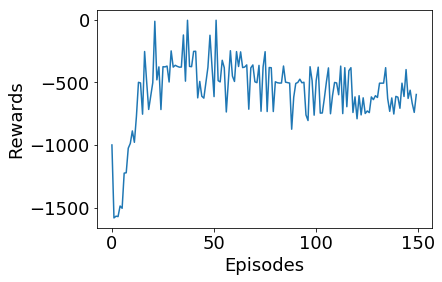

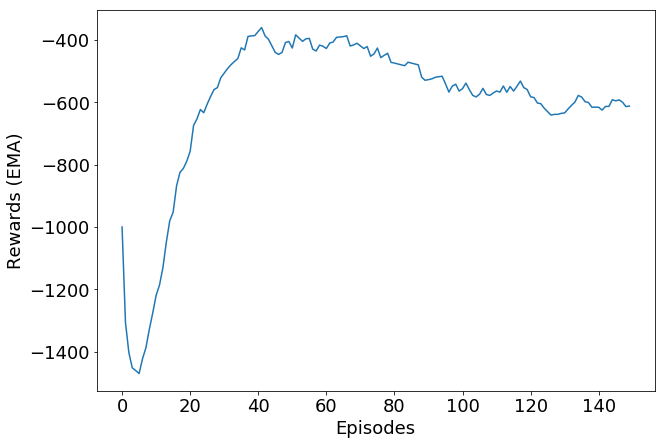

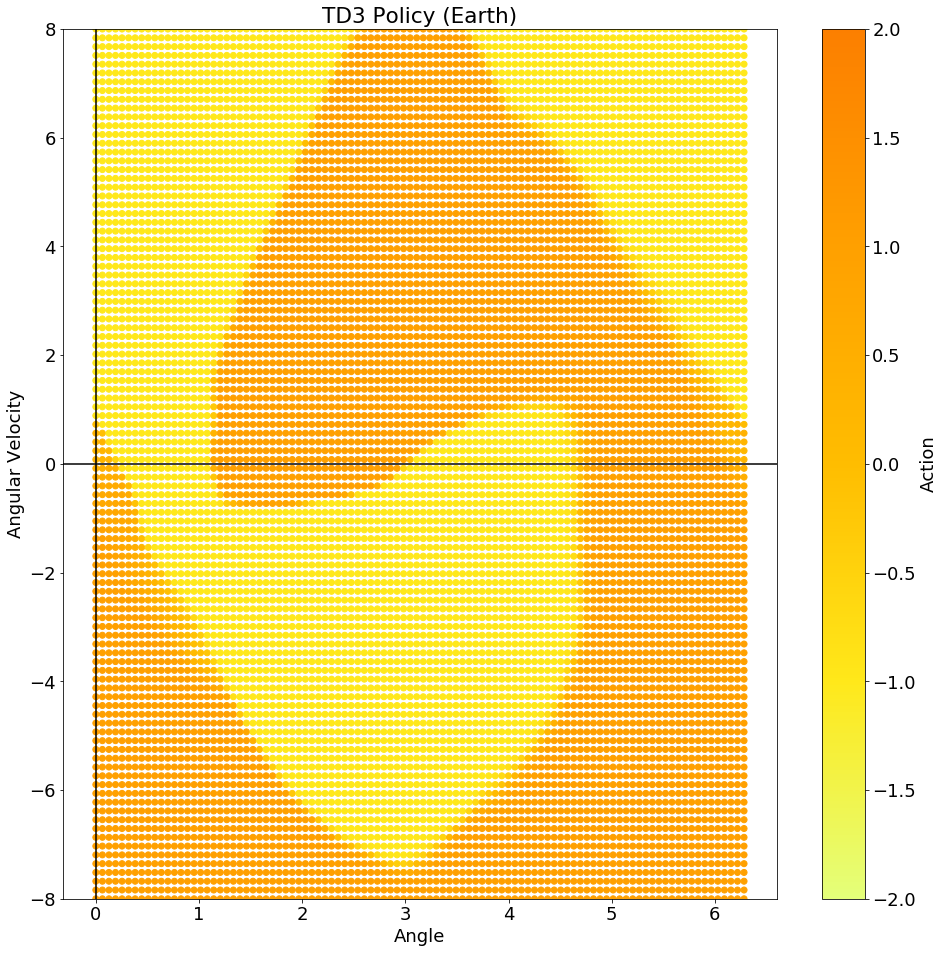

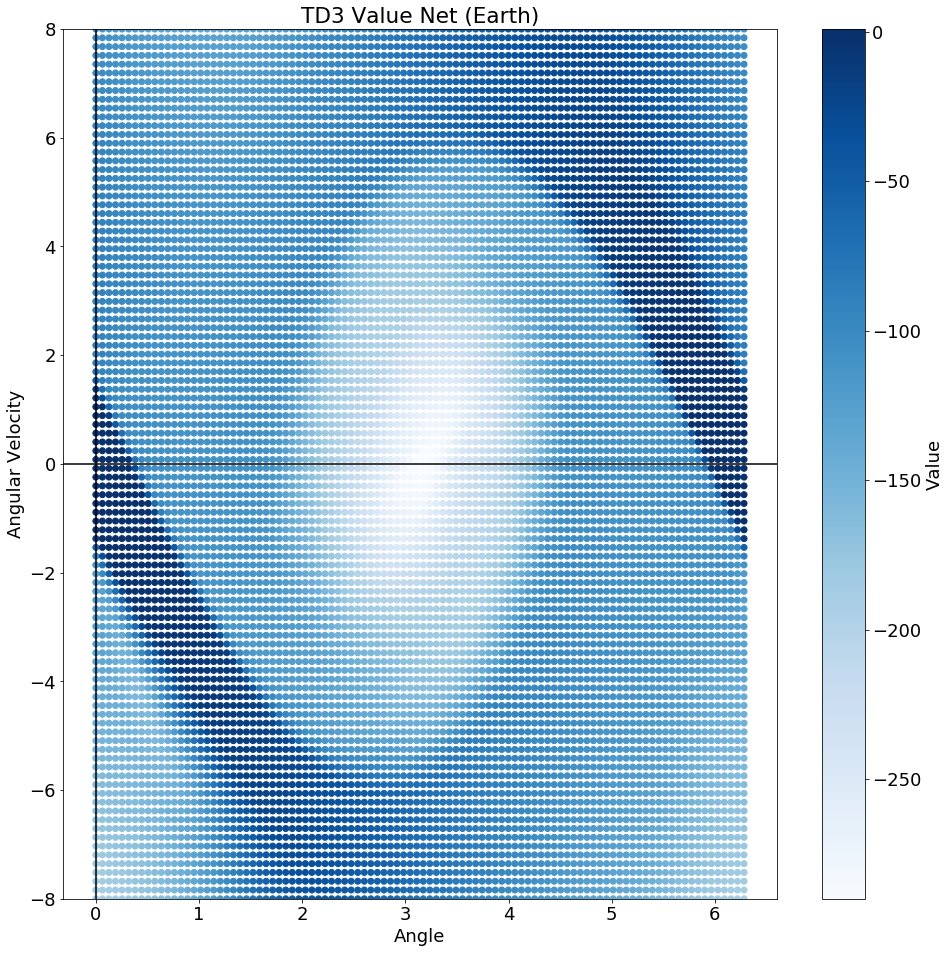

In [12]:
rewards_train = {}
rewards_test = {}
actions_earth = {}
rewards_train['earth1'] = []
thetas = []
theta_dt = []
actions = []

replay_buffer_size = 10000
replay_buffer = ReplayBuffer(replay_buffer_size)

for ep in range(num_eps):
    if ep % 100 == 0:
        print("Episode: ", ep)
    state = earth.reset()
    actions_earth[ep] = []
    ep_reward = 0
    for t in range(max_steps):
        action = policy_net.get_action(state)
        action = noise.get_action(action, t)
        next_state, reward, done, _ = earth.step(action)
        if ep >= 100:
            thetas.append(np.arcsin(state[1]))
            theta_dt.append(state[2])
            actions.append(action[0])
        replay_buffer.push(state, action, reward, next_state, done)
        if len(replay_buffer) > batch_size:
            td3_update(t, batch_size, replay_buffer)
        
        state = next_state
        ep_reward += reward
        actions_earth[ep].append(action)
        
        if done:
            break

    rewards_train['earth1'].append(ep_reward)

print('Earth Complete')
rewards_earth1 = rewards_train['earth1']
plot_rewards(rewards_earth1)
plot_smoothed(rewards_earth1, 0.1)

target_policy_net.eval()
target_value_net1.eval()
target_value_net2.eval()

graph_policy(target_policy_net, 100, "TD3 Policy (Earth)")
graph_policy(target_policy_net, 100, "TD3 Value Net (Earth)", False, target_value_net1)

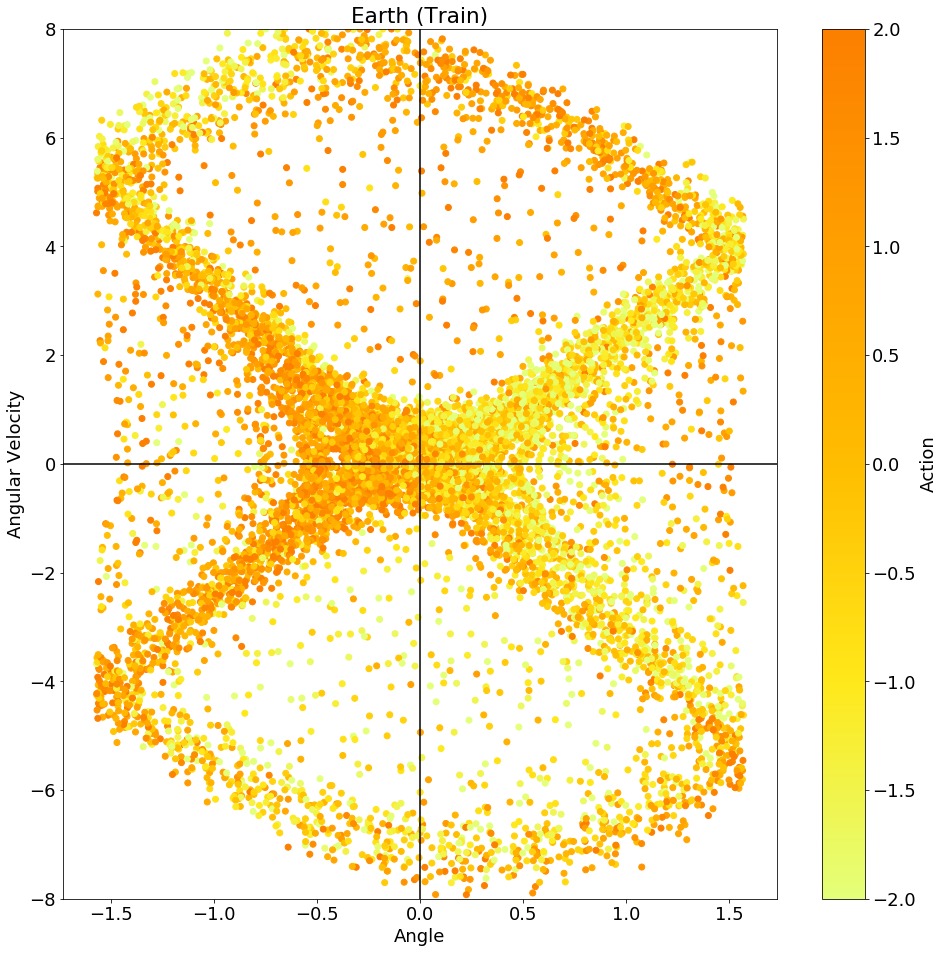

In [13]:
plt.rcParams.update({'font.size': 18})
plt.scatter(thetas, theta_dt, c = actions, cmap = plt.get_cmap('Wistia'), vmin = -2, vmax = 2)
plt.colorbar(label = 'Action')
plt.title("Earth (Train)")
plt.axhline(y=0, color='k')
plt.axvline(x=0, color='k')
plt.xlabel("Angle")
plt.ylabel("Angular Velocity")
plt.ylim(-8, 8)
fig = plt.gcf()
fig.set_size_inches(16, 16)
# plt.savefig("./Visualizations/earth_train_policy.jpg")
plt.show()

/Users/kenneth01px2018/DSC20/anaconda3/lib/python3.7/site-packages/gym/core.py:44: DeprecationWarning: WARN: The argument mode in render method is deprecated; use render_mode during environment initialization instead.
See here for more information: https://www.gymlibrary.ml/content/api/
  "The argument mode in render method is deprecated; "
/Users/kenneth01px2018/DSC20/anaconda3/lib/python3.7/site-packages/gym/core.py:44: DeprecationWarning: WARN: The argument mode in render method is deprecated; use render_mode during environment initialization instead.
See here for more information: https://www.gymlibrary.ml/content/api/
  "The argument mode in render method is deprecated; "


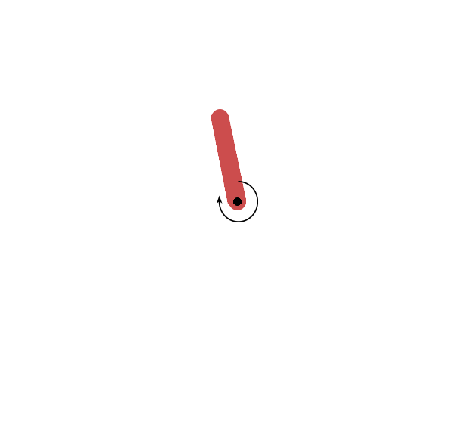

In [14]:
# Save video of earth agent
frames = []
for i in range(5):
    state = earth.reset()
    for t in range(max_steps):
        #Render to frames buffer
        frames.append(earth.render(mode="rgb_array"))
        time.sleep(0.001)
        action = policy_net.get_action(state)
        next_state, _, done, _ = earth.step(action)        
        state = next_state
        if done:
            break
earth.close()
save_frames_as_gif(frames, filename='earth_train_animation.gif')

## Moon (training)

/Users/kenneth01px2018/DSC20/anaconda3/lib/python3.7/site-packages/gym/core.py:318: DeprecationWarning: WARN: Initializing wrapper in old step API which returns one bool instead of two. It is recommended to set `new_step_api=True` to use new step API. This will be the default behaviour in future.
  "Initializing wrapper in old step API which returns one bool instead of two. It is recommended to set `new_step_api=True` to use new step API. This will be the default behaviour in future."
/Users/kenneth01px2018/DSC20/anaconda3/lib/python3.7/site-packages/gym/wrappers/step_api_compatibility.py:40: DeprecationWarning: WARN: Initializing environment in old step API which returns one bool instead of two. It is recommended to set `new_step_api=True` to use new step API. This will be the default behaviour in future.
  "Initializing environment in old step API which returns one bool instead of two. It is recommended to set `new_step_api=True` to use new step API. This will be the default behaviou

Episode:  0
Episode:  100
Moon Complete


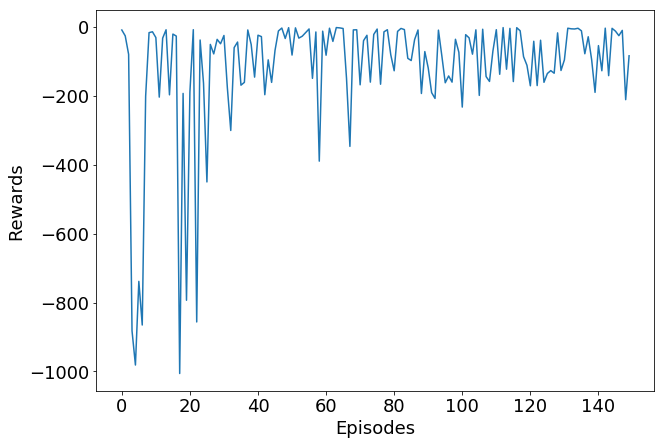

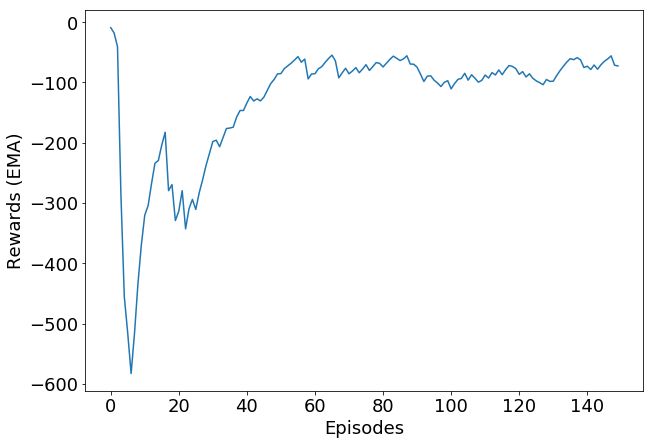

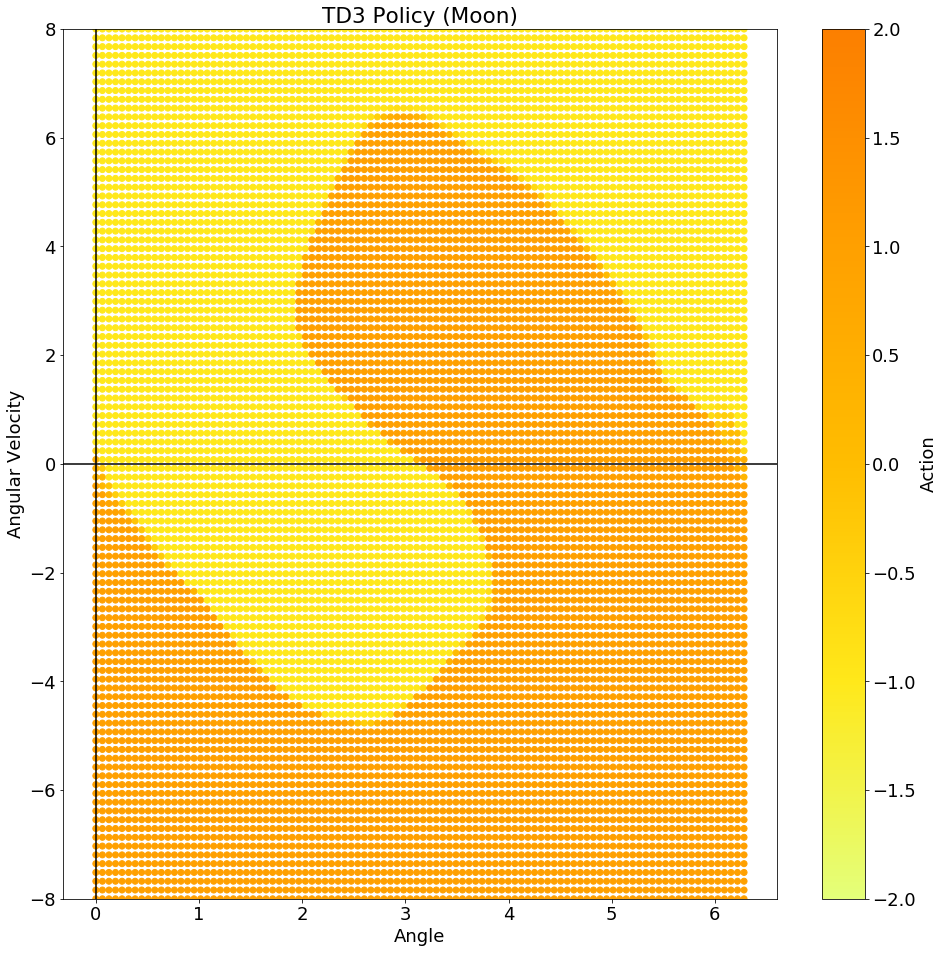

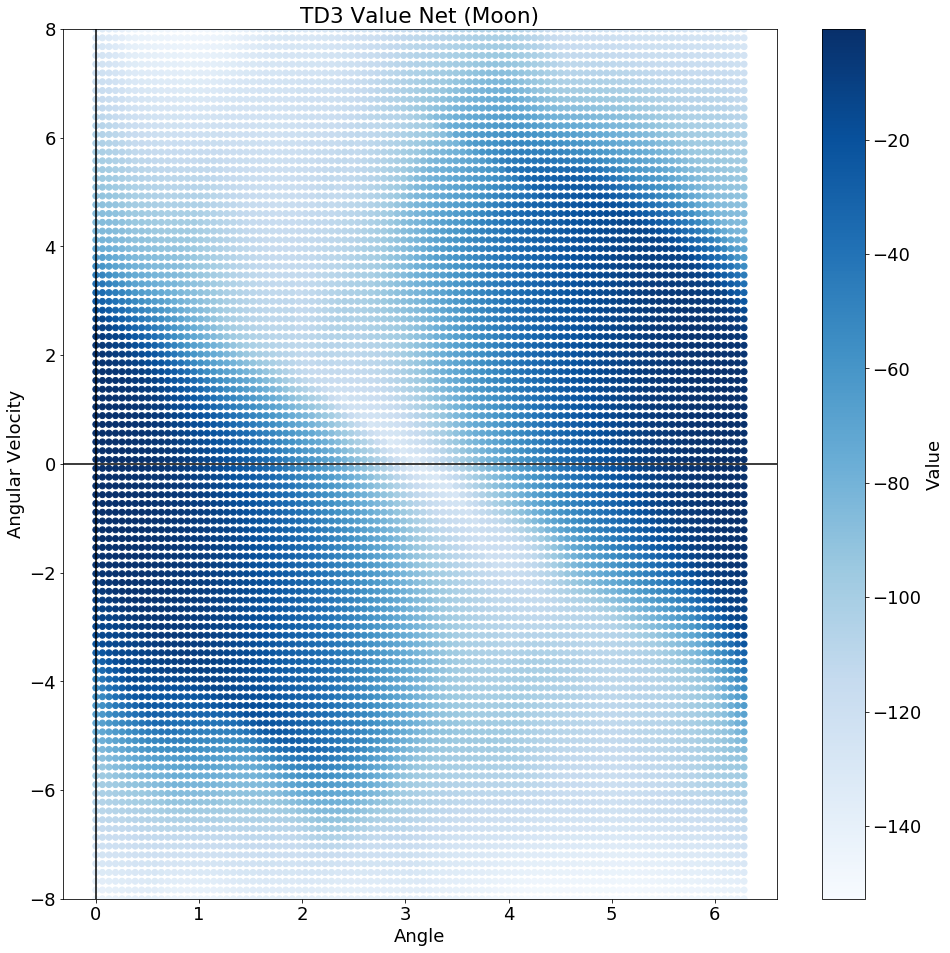

In [15]:
moon = NormalizedActions(gym.make('Pendulum-v1', g = 1.62))
moon.reset(seed = 24)

actions_moon = {}
rewards_train['moon1'] = []
thetas = []
theta_dt = []
actions = []

for ep in range(num_eps):
    if ep % 100 == 0:
        print("Episode: ", ep)
    state = moon.reset()
    actions_moon[ep] = []
    ep_reward = 0
    for t in range(max_steps):
        action = policy_net.get_action(state)
        action = noise.get_action(action, t)
        next_state, reward, done, _ = moon.step(action)
        if ep >= 100:
            thetas.append(np.arcsin(state[1]))
            theta_dt.append(state[2])
            actions.append(action[0])
        replay_buffer.push(state, action, reward, next_state, done)
        if len(replay_buffer) > batch_size:
            td3_update(t, batch_size, replay_buffer)
        
        state = next_state
        ep_reward += reward
        actions_moon[ep].append(action)
        
        if done:
            break

    rewards_train['moon1'].append(ep_reward)

print('Moon Complete')
rewards_moon1 = rewards_train['moon1']
plot_rewards(rewards_moon1)
plot_smoothed(rewards_moon1, 0.1)

target_policy_net.eval()
target_value_net1.eval()
target_value_net2.eval()

graph_policy(target_policy_net, 100, "TD3 Policy (Moon)")
graph_policy(target_policy_net, 100, "TD3 Value Net (Moon)", False, target_value_net1)

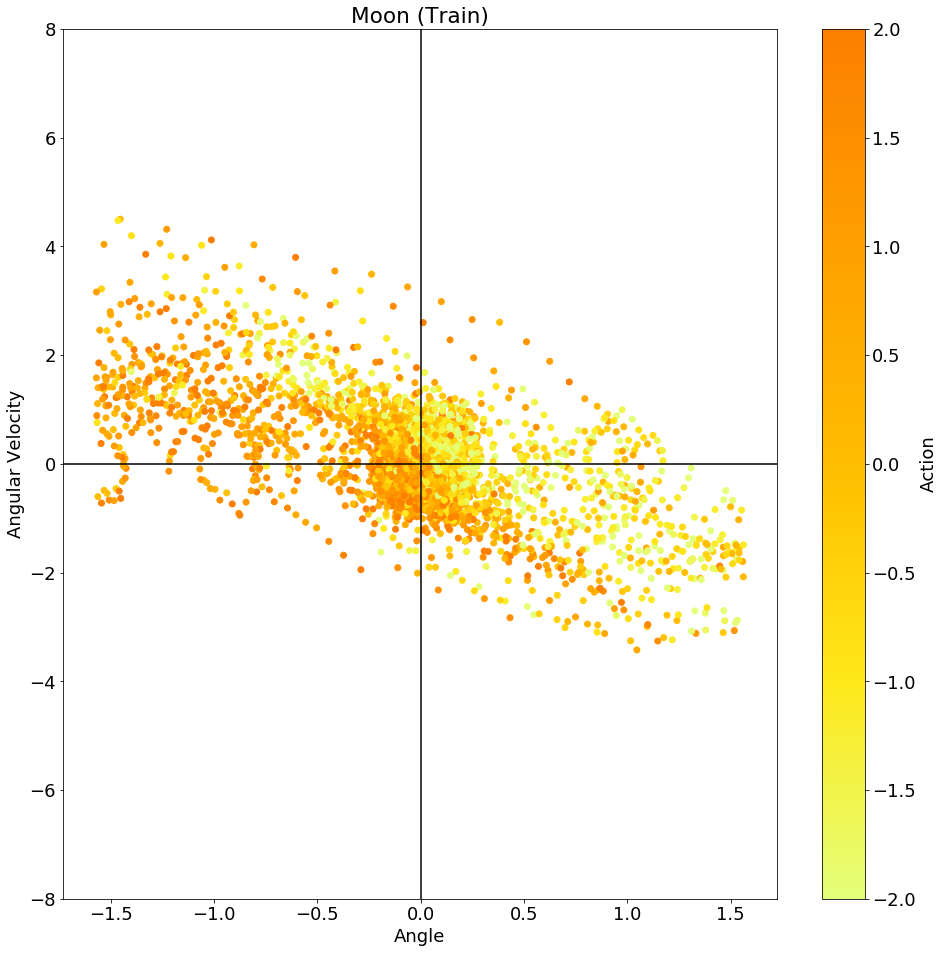

In [16]:
plt.scatter(thetas, theta_dt, c = actions, cmap = plt.get_cmap('Wistia'), vmin = -2, vmax = 2)
plt.colorbar(label = 'Action')
plt.title("Moon (Train)")
plt.axhline(y=0, color='k')
plt.axvline(x=0, color='k')
plt.xlabel("Angle")
plt.ylabel("Angular Velocity")
plt.ylim(-8, 8)
fig = plt.gcf()
fig.set_size_inches(16, 16)
# plt.savefig("./Visualizations/moon_train_policy.jpg")
plt.show()

/Users/kenneth01px2018/DSC20/anaconda3/lib/python3.7/site-packages/gym/core.py:44: DeprecationWarning: WARN: The argument mode in render method is deprecated; use render_mode during environment initialization instead.
See here for more information: https://www.gymlibrary.ml/content/api/
  "The argument mode in render method is deprecated; "


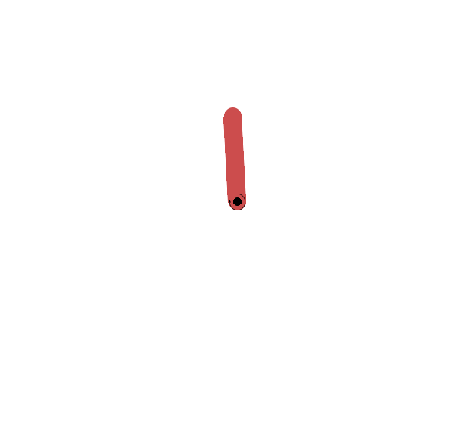

In [17]:
# Save video of moon agent
frames = []
for i in range(5):
    state = moon.reset()
    for t in range(max_steps):
        #Render to frames buffer
        frames.append(moon.render(mode="rgb_array"))
        time.sleep(0.001)
        action = policy_net.get_action(state)
        next_state, _, done, _ = moon.step(action)        
        state = next_state
        if done:
            break
moon.close()
save_frames_as_gif(frames, filename='moon_train_animation.gif')

## Mars (training)

/Users/kenneth01px2018/DSC20/anaconda3/lib/python3.7/site-packages/gym/core.py:318: DeprecationWarning: WARN: Initializing wrapper in old step API which returns one bool instead of two. It is recommended to set `new_step_api=True` to use new step API. This will be the default behaviour in future.
  "Initializing wrapper in old step API which returns one bool instead of two. It is recommended to set `new_step_api=True` to use new step API. This will be the default behaviour in future."
/Users/kenneth01px2018/DSC20/anaconda3/lib/python3.7/site-packages/gym/wrappers/step_api_compatibility.py:40: DeprecationWarning: WARN: Initializing environment in old step API which returns one bool instead of two. It is recommended to set `new_step_api=True` to use new step API. This will be the default behaviour in future.
  "Initializing environment in old step API which returns one bool instead of two. It is recommended to set `new_step_api=True` to use new step API. This will be the default behaviou

Episode:  0
Episode:  100
Mars Complete


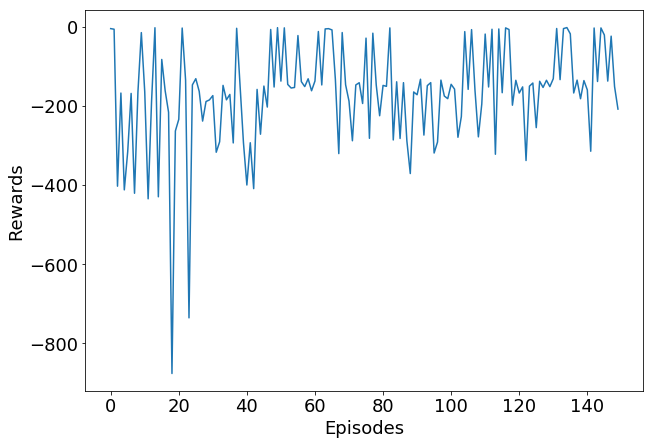

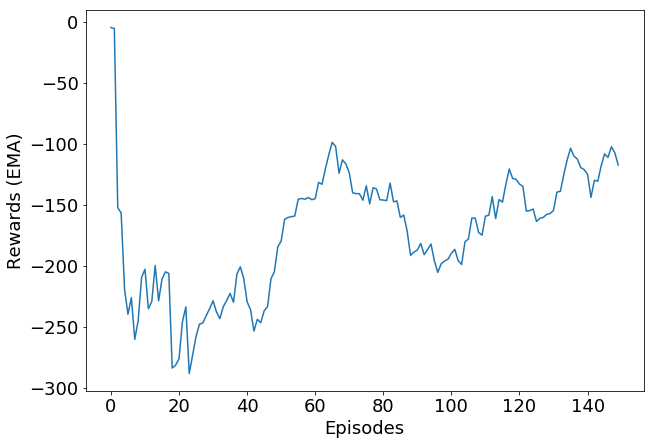

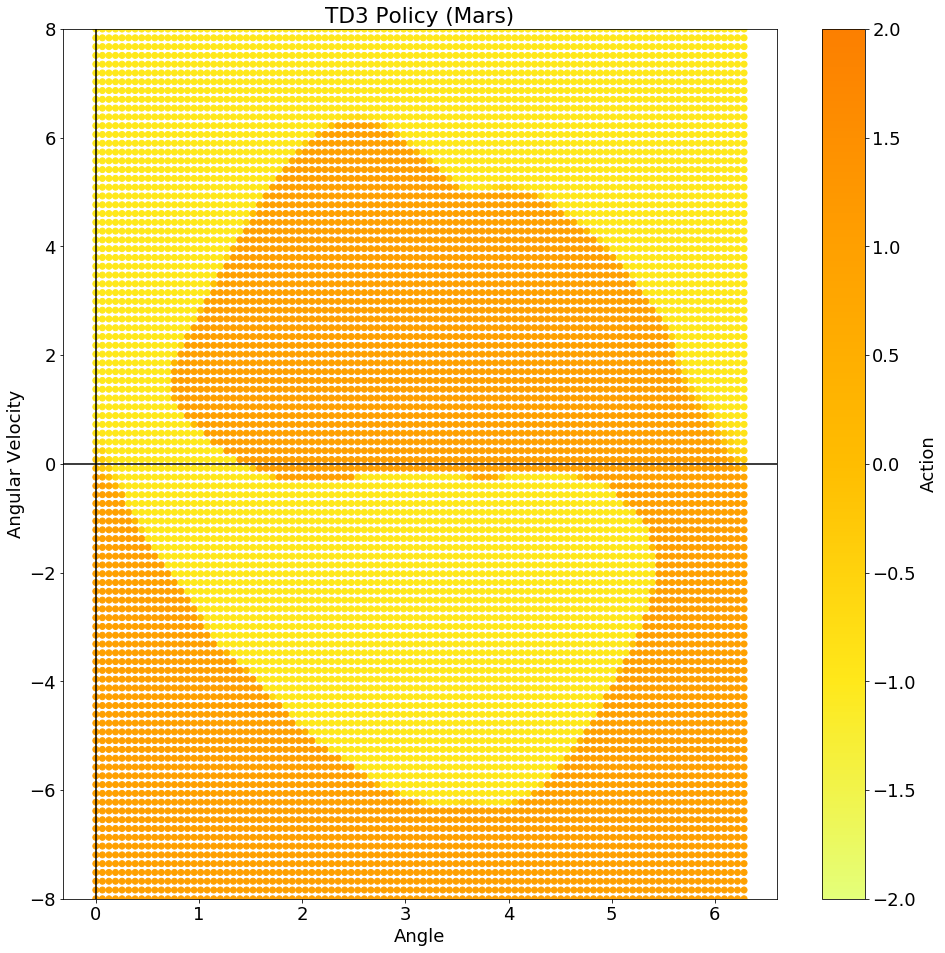

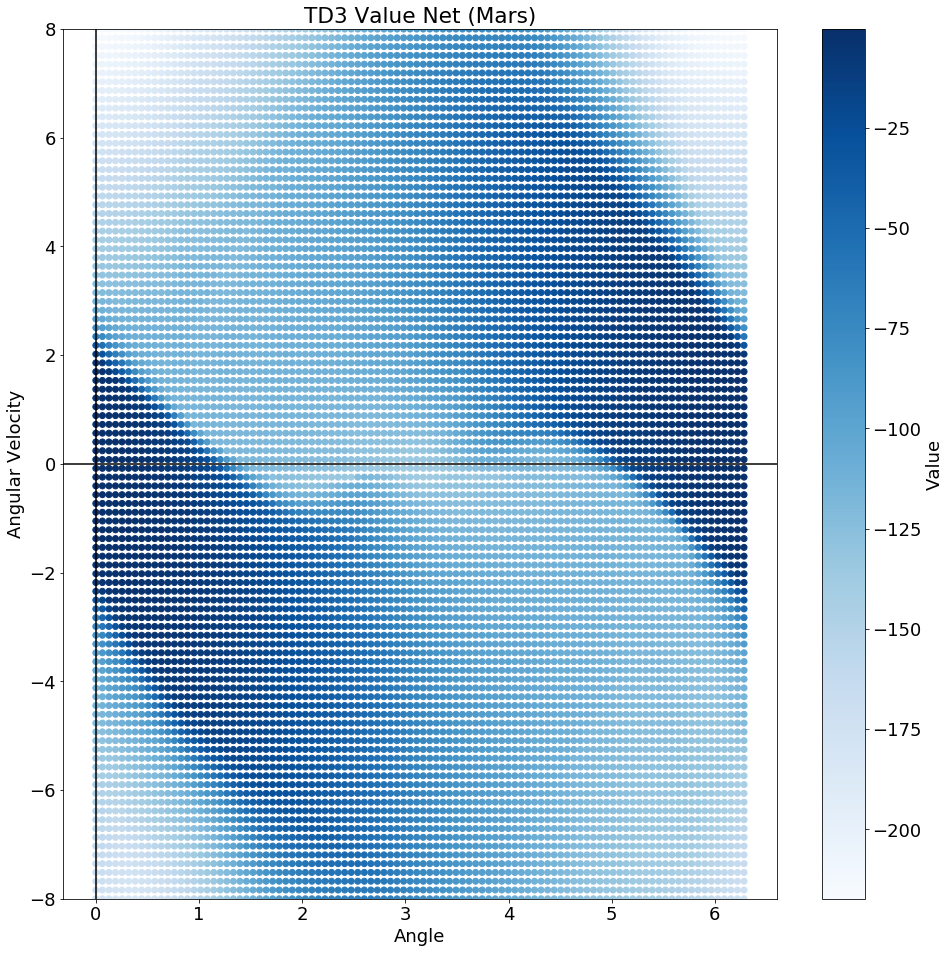

In [18]:
mars = NormalizedActions(gym.make('Pendulum-v1', g = 3.71))
mars.reset(seed = 24)
actions_mars = {}
rewards_train['mars1'] = []
thetas = []
theta_dt = []
actions = []

for ep in range(num_eps):
    if ep % 100 == 0:
        print("Episode: ", ep)
    state = mars.reset()
    actions_mars[ep] = []
    ep_reward = 0
    for t in range(max_steps):
        action = policy_net.get_action(state)
        action = noise.get_action(action, t)
        next_state, reward, done, _ = mars.step(action)
        if ep >= 100:
            thetas.append(np.arcsin(state[1]))
            theta_dt.append(state[2])
            actions.append(action[0])
        replay_buffer.push(state, action, reward, next_state, done)
        if len(replay_buffer) > batch_size:
            td3_update(t, batch_size, replay_buffer)
        
        state = next_state
        ep_reward += reward
        actions_mars[ep].append(action)
        
        if done:
            break

    rewards_train['mars1'].append(ep_reward)

print('Mars Complete')
rewards_mars1 = rewards_train['mars1']
plot_rewards(rewards_mars1)
plot_smoothed(rewards_mars1, 0.1)

target_policy_net.eval()
target_value_net1.eval()
target_value_net2.eval()

graph_policy(target_policy_net, 100, "TD3 Policy (Mars)")
graph_policy(target_policy_net, 100, "TD3 Value Net (Mars)", False, target_value_net1)

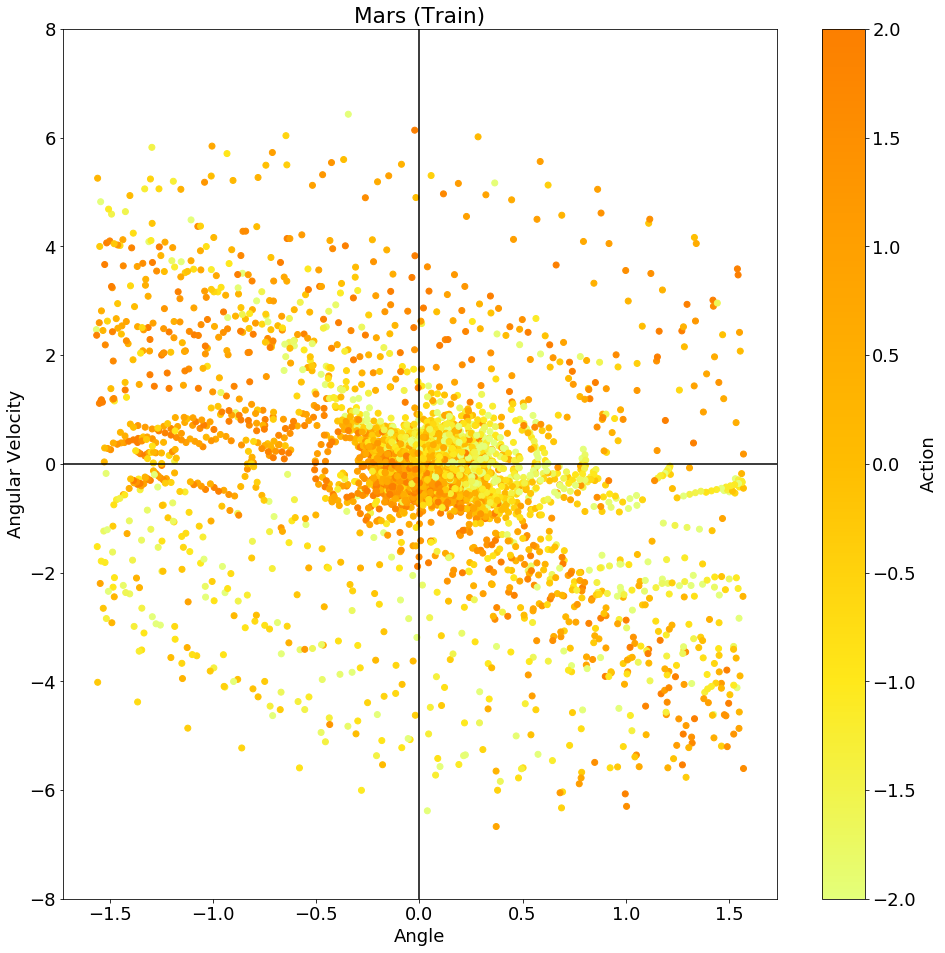

In [19]:
plt.scatter(thetas, theta_dt, c = actions, cmap = plt.get_cmap('Wistia'), vmin = -2, vmax = 2)
plt.colorbar(label = 'Action')
plt.title("Mars (Train)")
plt.axhline(y=0, color='k')
plt.axvline(x=0, color='k')
plt.xlabel("Angle")
plt.ylabel("Angular Velocity")
plt.ylim(-8, 8)
fig = plt.gcf()
fig.set_size_inches(16, 16)
# plt.savefig("./Visualizations/mars_train_policy.jpg")
plt.show()

/Users/kenneth01px2018/DSC20/anaconda3/lib/python3.7/site-packages/gym/core.py:44: DeprecationWarning: WARN: The argument mode in render method is deprecated; use render_mode during environment initialization instead.
See here for more information: https://www.gymlibrary.ml/content/api/
  "The argument mode in render method is deprecated; "


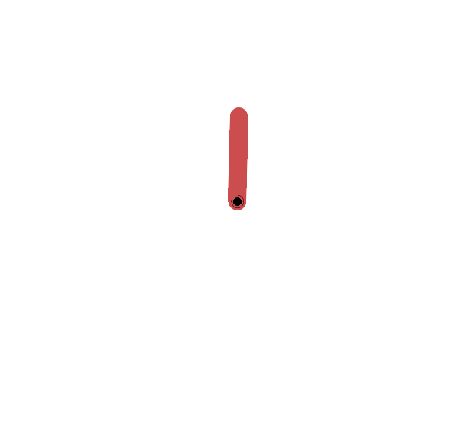

In [20]:
# Save video of mars agent
frames = []
for i in range(5):
    state = mars.reset()
    for t in range(max_steps):
        #Render to frames buffer
        frames.append(mars.render(mode="rgb_array"))
        time.sleep(0.001)
        action = policy_net.get_action(state)
        next_state, _, done, _ = mars.step(action)        
        state = next_state
        if done:
            break
mars.close()
save_frames_as_gif(frames, filename='mars_train_animation.gif')

## Sun (training)

/Users/kenneth01px2018/DSC20/anaconda3/lib/python3.7/site-packages/gym/core.py:318: DeprecationWarning: WARN: Initializing wrapper in old step API which returns one bool instead of two. It is recommended to set `new_step_api=True` to use new step API. This will be the default behaviour in future.
  "Initializing wrapper in old step API which returns one bool instead of two. It is recommended to set `new_step_api=True` to use new step API. This will be the default behaviour in future."
/Users/kenneth01px2018/DSC20/anaconda3/lib/python3.7/site-packages/gym/wrappers/step_api_compatibility.py:40: DeprecationWarning: WARN: Initializing environment in old step API which returns one bool instead of two. It is recommended to set `new_step_api=True` to use new step API. This will be the default behaviour in future.
  "Initializing environment in old step API which returns one bool instead of two. It is recommended to set `new_step_api=True` to use new step API. This will be the default behaviou

Episode:  0
Episode:  100
Sun Complete


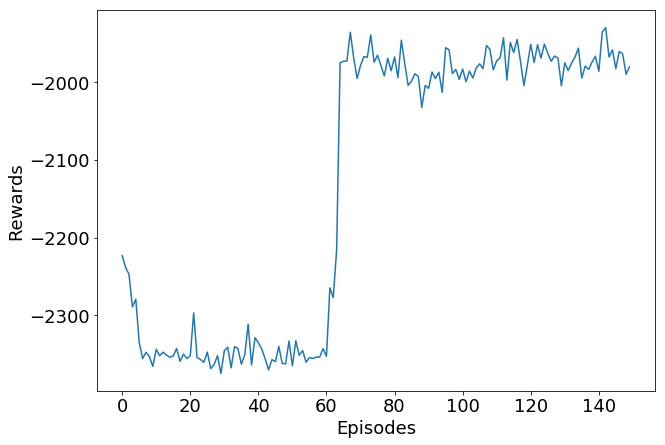

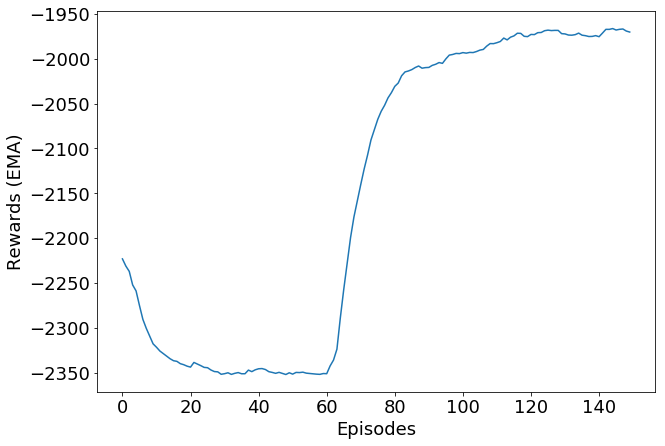

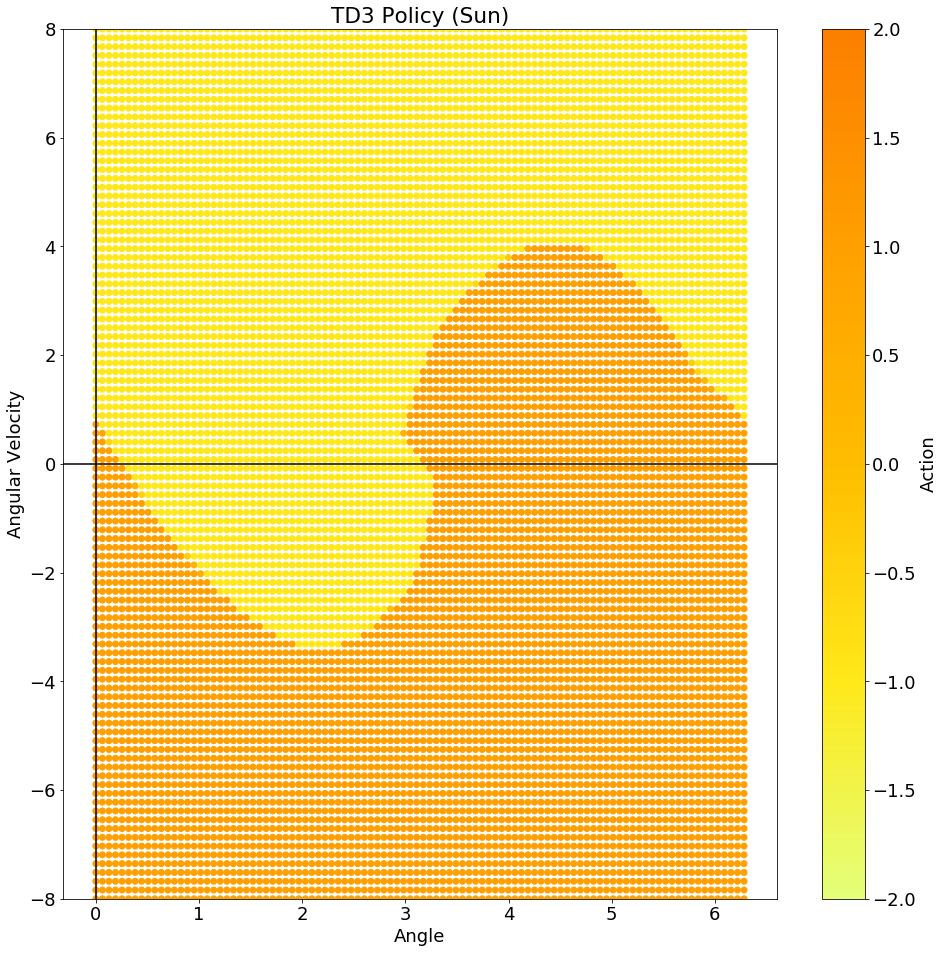

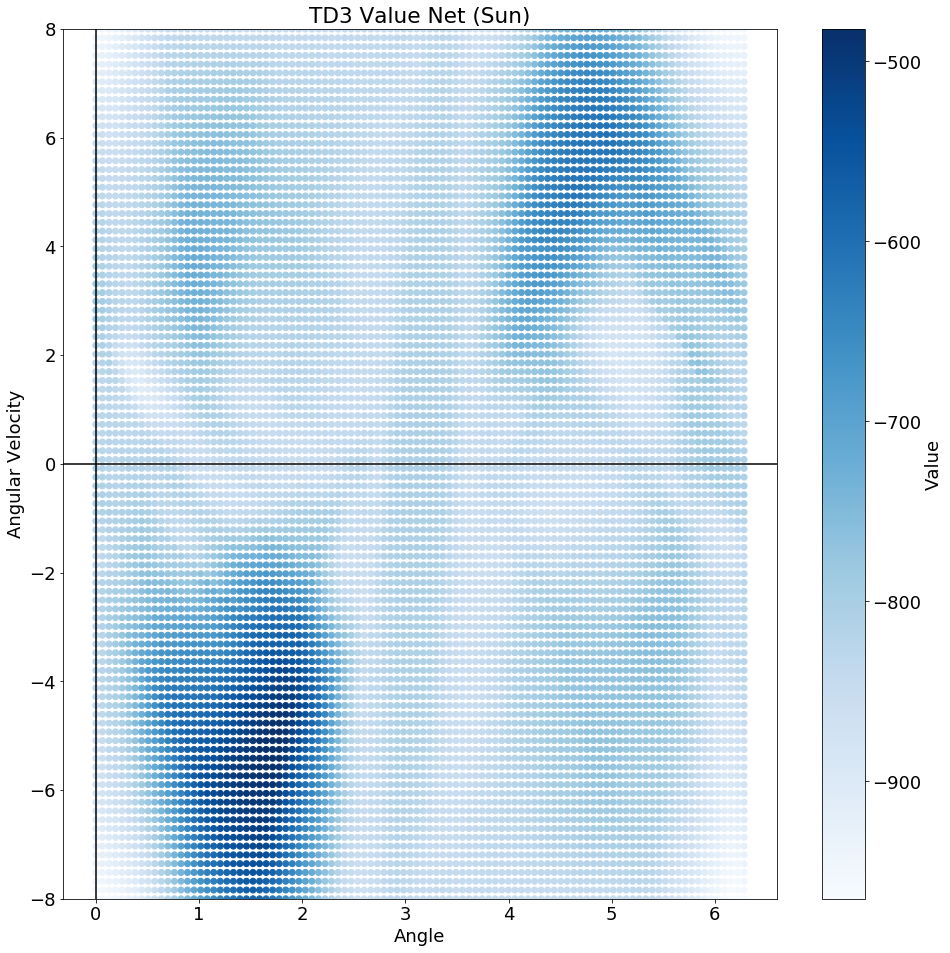

In [21]:
sun = NormalizedActions(gym.make('Pendulum-v1', g = 275))
actions_sun = {}
sun.reset(seed = 24)

rewards_train['sun1'] = []

for ep in range(num_eps):
    if ep % 100 == 0:
        print("Episode: ", ep)
    state = sun.reset()
    actions_sun[ep] = []
    ep_reward = 0
    for t in range(max_steps):
        action = policy_net.get_action(state)
        action = noise.get_action(action, t)
        next_state, reward, done, _ = sun.step(action)
        replay_buffer.push(state, action, reward, next_state, done)
        if len(replay_buffer) > batch_size:
            td3_update(t, batch_size, replay_buffer)
        
        state = next_state
        ep_reward += reward
        actions_sun[ep].append(action)
        
        if done:
            break

    rewards_train['sun1'].append(ep_reward)

print('Sun Complete')
rewards_sun1 = rewards_train['sun1']
plot_rewards(rewards_sun1)
plot_smoothed(rewards_sun1, 0.1)

target_policy_net.eval()
target_value_net1.eval()
target_value_net2.eval()

graph_policy(target_policy_net, 100, "TD3 Policy (Sun)")
graph_policy(target_policy_net, 100, "TD3 Value Net (Sun)", False, target_value_net1)

/Users/kenneth01px2018/DSC20/anaconda3/lib/python3.7/site-packages/gym/core.py:44: DeprecationWarning: WARN: The argument mode in render method is deprecated; use render_mode during environment initialization instead.
See here for more information: https://www.gymlibrary.ml/content/api/
  "The argument mode in render method is deprecated; "


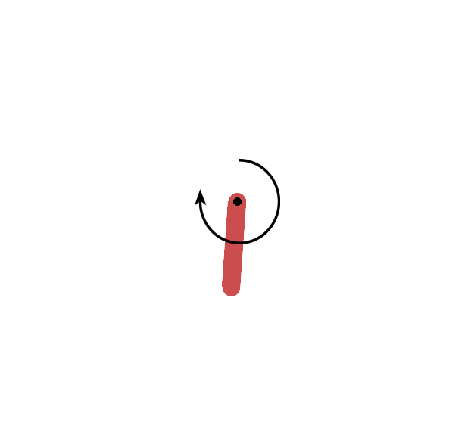

In [22]:
# Save video of sun agent
frames = []
for i in range(5):
    state = sun.reset()
    for t in range(max_steps):
        #Render to frames buffer
        frames.append(sun.render(mode="rgb_array"))
        time.sleep(0.001)
        action = policy_net.get_action(state)
        next_state, _, done, _ = sun.step(action)        
        state = next_state
        if done:
            break
sun.close()
save_frames_as_gif(frames, filename='sun_train_animation.gif')

## Jupiter (training)

/Users/kenneth01px2018/DSC20/anaconda3/lib/python3.7/site-packages/gym/core.py:318: DeprecationWarning: WARN: Initializing wrapper in old step API which returns one bool instead of two. It is recommended to set `new_step_api=True` to use new step API. This will be the default behaviour in future.
  "Initializing wrapper in old step API which returns one bool instead of two. It is recommended to set `new_step_api=True` to use new step API. This will be the default behaviour in future."
/Users/kenneth01px2018/DSC20/anaconda3/lib/python3.7/site-packages/gym/wrappers/step_api_compatibility.py:40: DeprecationWarning: WARN: Initializing environment in old step API which returns one bool instead of two. It is recommended to set `new_step_api=True` to use new step API. This will be the default behaviour in future.
  "Initializing environment in old step API which returns one bool instead of two. It is recommended to set `new_step_api=True` to use new step API. This will be the default behaviou

Episode:  0
Episode:  100
Jupiter Complete


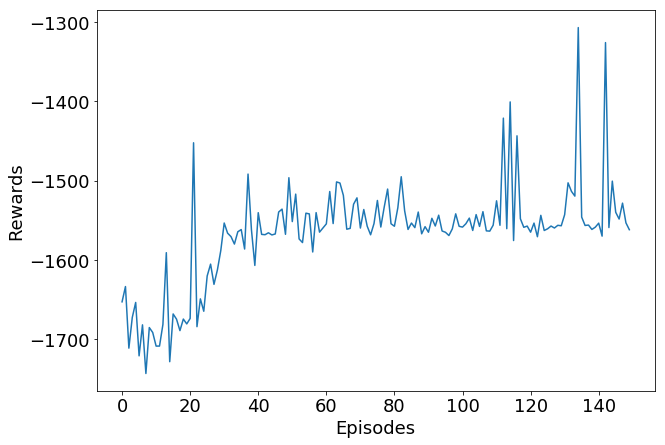

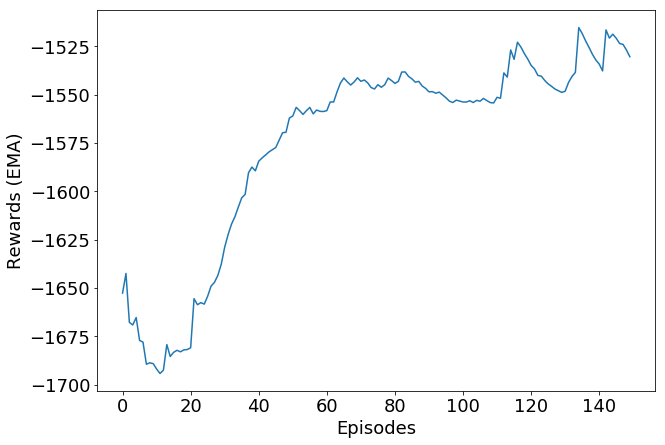

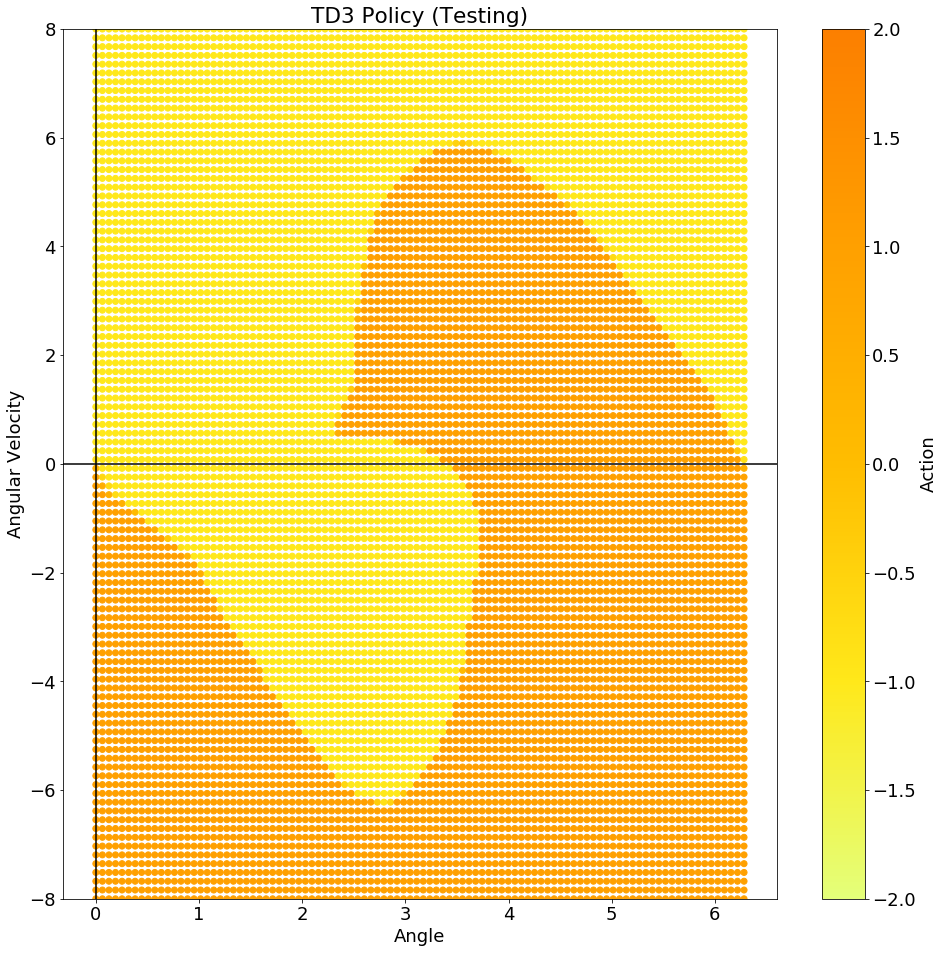

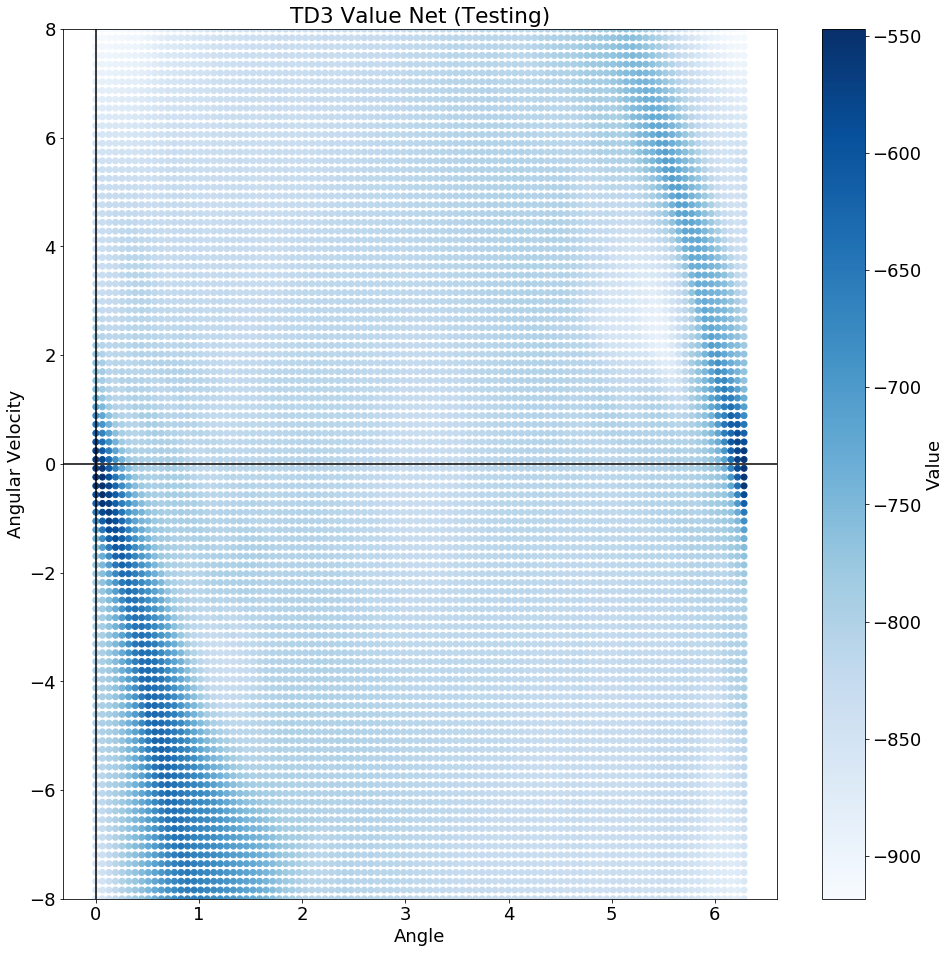

In [23]:
jupiter = NormalizedActions(gym.make('Pendulum-v1', g = 24.5))
jupiter.reset(seed = 24)
actions_jupiter = {}
rewards_train['jupiter1'] = []

for ep in range(num_eps):
    if ep % 100 == 0:
        print("Episode: ", ep)
    state = jupiter.reset()
    actions_jupiter[ep] = []
    ep_reward = 0
    for t in range(max_steps):
        action = policy_net.get_action(state)
        action = noise.get_action(action, t)
        next_state, reward, done, _ = jupiter.step(action)
        replay_buffer.push(state, action, reward, next_state, done)
        if len(replay_buffer) > batch_size:
            td3_update(t, batch_size, replay_buffer)
        
        state = next_state
        ep_reward += reward
        actions_jupiter[ep].append(action)
        
        if done:
            break

    rewards_train['jupiter1'].append(ep_reward)

print('Jupiter Complete')
rewards_jupiter1 = rewards_train['jupiter1']
plot_rewards(rewards_jupiter1)
plot_smoothed(rewards_jupiter1, 0.1)

target_policy_net.eval()
target_value_net1.eval()
target_value_net2.eval()

graph_policy(target_policy_net, 100, "TD3 Policy (Testing)")
graph_policy(target_policy_net, 100, "TD3 Value Net (Testing)", False, target_value_net1)

/Users/kenneth01px2018/DSC20/anaconda3/lib/python3.7/site-packages/gym/core.py:44: DeprecationWarning: WARN: The argument mode in render method is deprecated; use render_mode during environment initialization instead.
See here for more information: https://www.gymlibrary.ml/content/api/
  "The argument mode in render method is deprecated; "


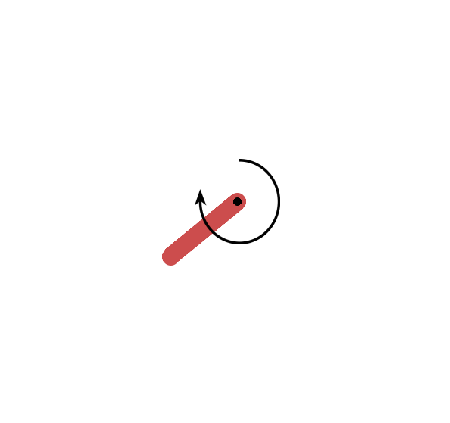

In [24]:
# Save video of jupiter agent
frames = []
for i in range(5):
    state = jupiter.reset()
    for t in range(max_steps):
        #Render to frames buffer
        frames.append(jupiter.render(mode="rgb_array"))
        time.sleep(0.001)
        action = policy_net.get_action(state)
        next_state, _, done, _ = jupiter.step(action)        
        state = next_state
        if done:
            break
jupiter.close()
save_frames_as_gif(frames, filename='jupiter_train_animation.gif')

## Save data

In [25]:
train_df = pd.DataFrame(rewards_train)
train_df.to_csv('./Data/train_rewards_pendulum_logcosh.csv')

## Plot results for all trips

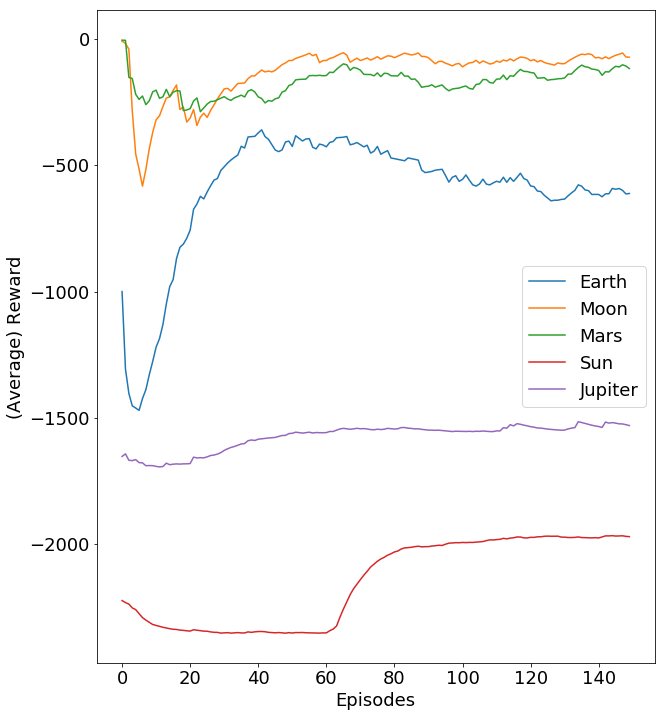

In [27]:
plt.rcParams.update({'font.size': 18})
figure, axis = plt.subplots(1, 1)

axis.plot(train_df.ewm(alpha = 0.1).mean())
axis.set_xlabel("Episodes")
axis.set_ylabel("(Average) Reward")
axis.legend(['Earth', "Moon", "Mars", "Sun", "Jupiter"])
# axis.set_ylim(-1100, 0)
fig = plt.gcf()
fig.set_size_inches(10, 12)
# plt.savefig("./Visualizations/train_no_CL_logcosh.jpg")
plt.show()

### Earth (test)

Earth Complete


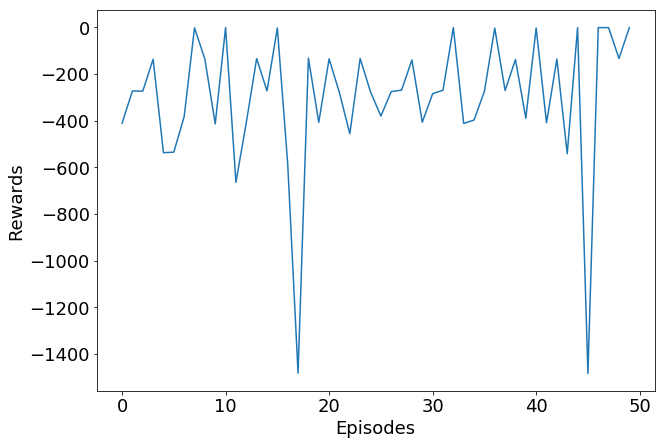

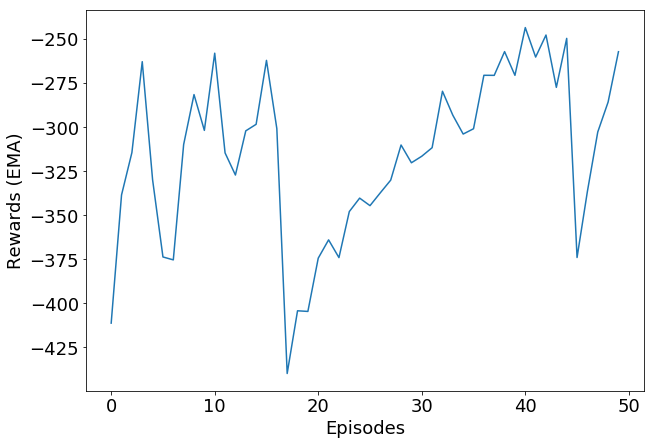

In [28]:
rewards_test['earth'] = []
test_eps = 50
actions_earth_test = {}
thetas = []
theta_dt = []
actions = []

for ep in range(test_eps):
    state = earth.reset()
    actions_earth_test[ep] = []
    ep_reward = 0
    for t in range(max_steps):
        action = policy_net.get_action(state)
        next_state, reward, done, _ = earth.step(action)
        thetas.append(np.arcsin(state[1]))
        theta_dt.append(state[2])
        actions.append(action[0])
        state = next_state
        ep_reward += reward
        actions_earth_test[ep].append(action)
        
        if done:
            break

    rewards_test['earth'].append(ep_reward)

print('Earth Complete')
rewards_earth = rewards_test['earth']
plot_rewards(rewards_earth)
plot_smoothed(rewards_earth, 0.1)

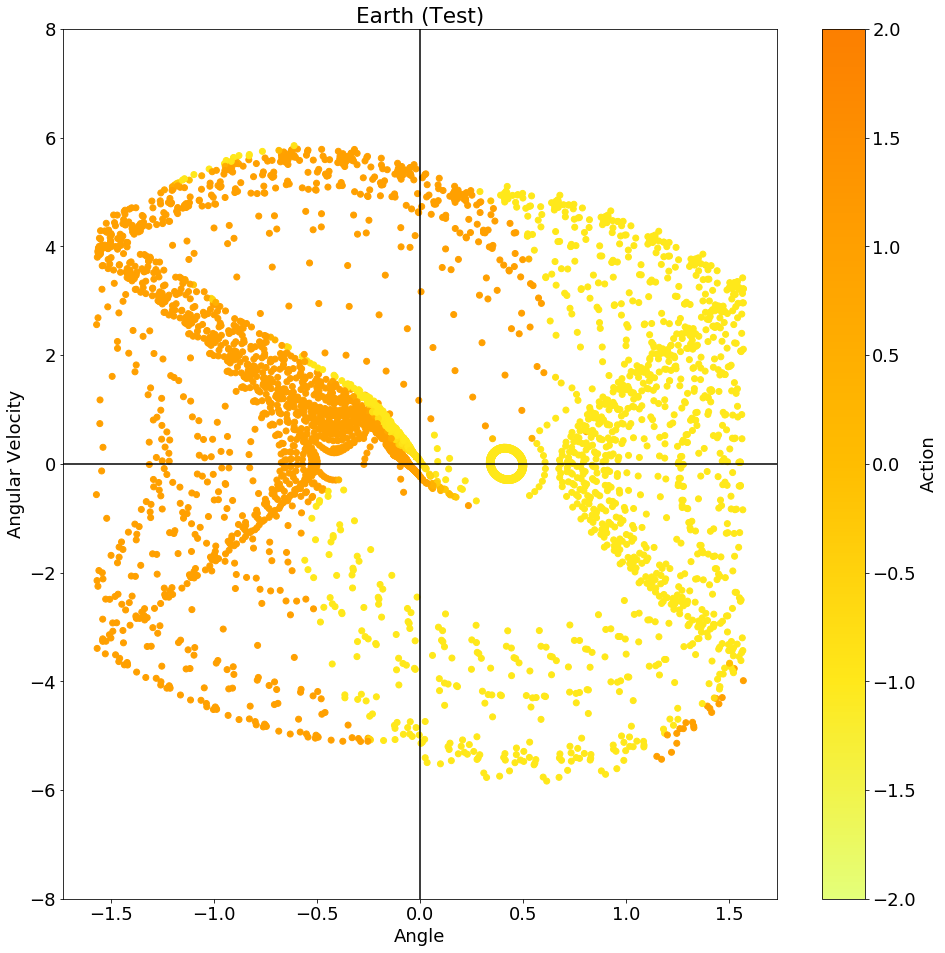

In [29]:
plt.scatter(thetas, theta_dt, c = actions, cmap = plt.get_cmap('Wistia'), vmin = -2, vmax = 2)
plt.colorbar(label = 'Action')
plt.title("Earth (Test)")
plt.axhline(y=0, color='k')
plt.axvline(x=0, color='k')
plt.xlabel("Angle")
plt.ylabel("Angular Velocity")
plt.ylim(-8, 8)
fig = plt.gcf()
fig.set_size_inches(16, 16)
# plt.savefig("./Visualizations/earth_test_policy.jpg")
plt.show()

/Users/kenneth01px2018/DSC20/anaconda3/lib/python3.7/site-packages/gym/core.py:44: DeprecationWarning: WARN: The argument mode in render method is deprecated; use render_mode during environment initialization instead.
See here for more information: https://www.gymlibrary.ml/content/api/
  "The argument mode in render method is deprecated; "


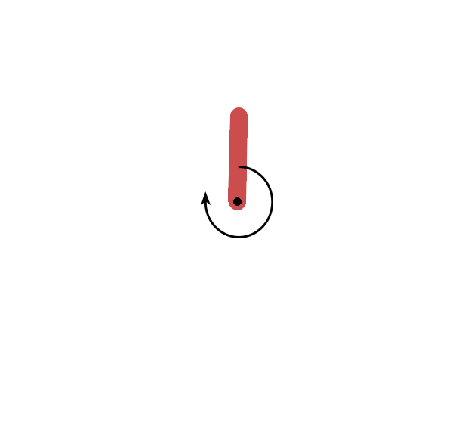

In [30]:
# Save video of earth agent
frames = []
for i in range(5):
    state = earth.reset()
    for t in range(max_steps):
        #Render to frames buffer
        frames.append(earth.render(mode="rgb_array"))
        time.sleep(0.001)
        action = policy_net.get_action(state)
        next_state, _, done, _ = earth.step(action)        
        state = next_state
        if done:
            break
earth.close()
save_frames_as_gif(frames, filename='earth_test_animation.gif')

## Moon (test)

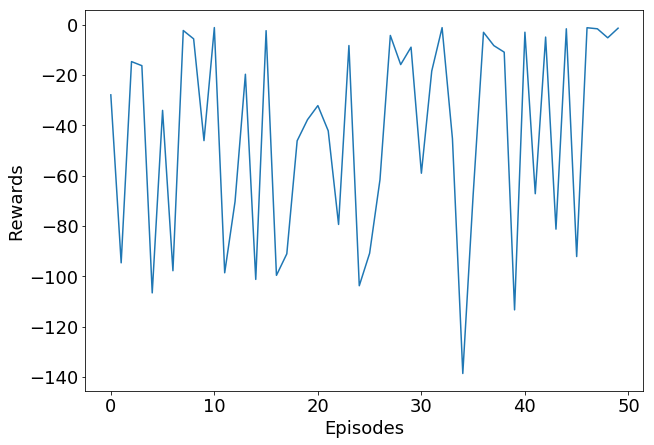

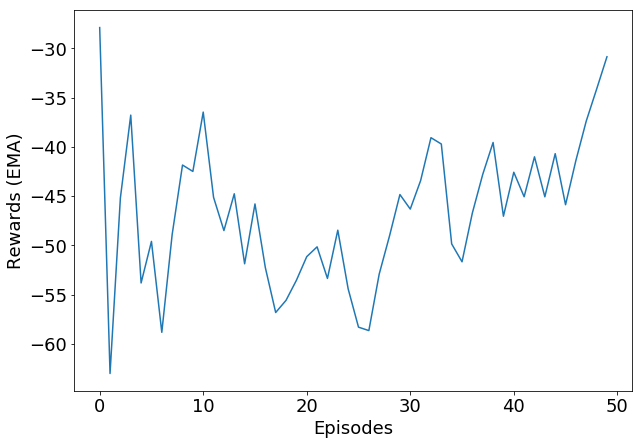

In [31]:
rewards_test['moon'] = []
actions_moon_test = {}
thetas = []
theta_dt = []
actions = []

for ep in range(test_eps):
    state = moon.reset()
    actions_moon_test[ep] = []
    ep_reward = 0
    for t in range(max_steps):
        action = policy_net.get_action(state)
        next_state, reward, done, _ = moon.step(action)
        thetas.append(np.arcsin(state[1]))
        theta_dt.append(state[2])
        actions.append(action[0])
        state = next_state
        ep_reward += reward
        actions_moon_test[ep].append(action)
        if done:
            break

    rewards_test['moon'].append(ep_reward)

rewards_moon = rewards_test['moon']
plot_rewards(rewards_moon)
plot_smoothed(rewards_moon, 0.1)

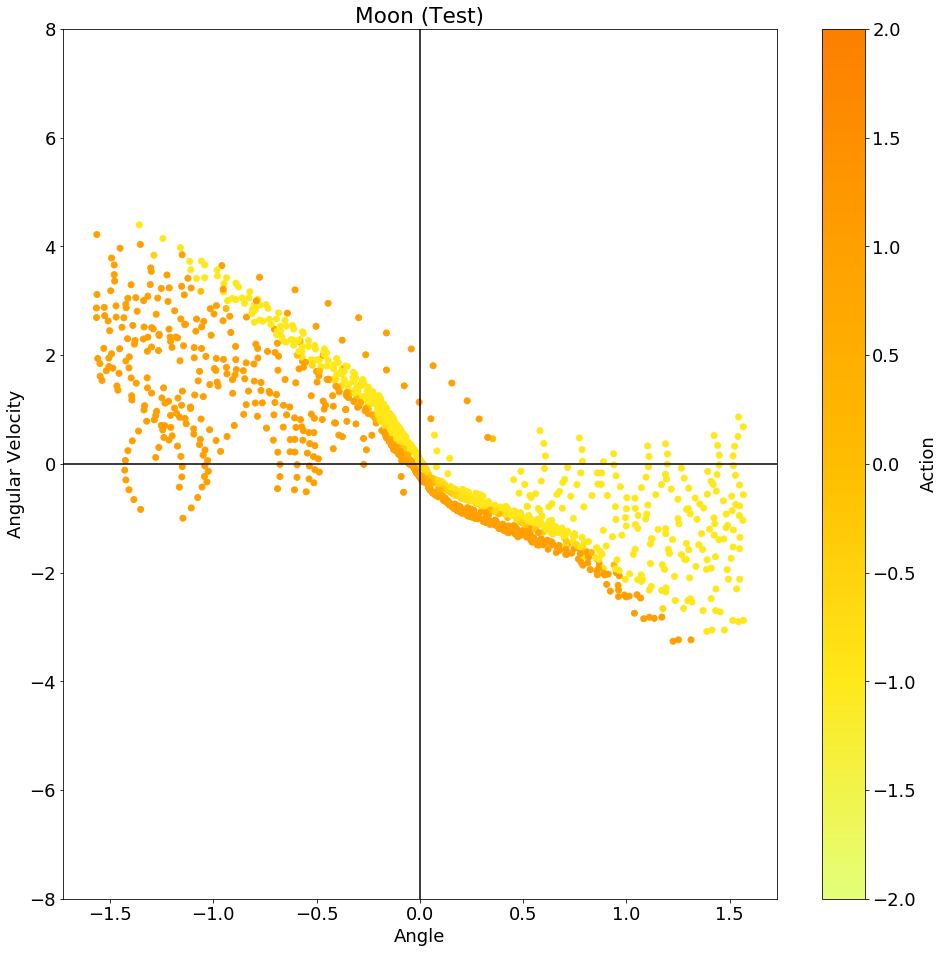

In [ ]:
plt.scatter(thetas, theta_dt, c = actions, cmap = plt.get_cmap('Wistia'), vmin = -2, vmax = 2)
plt.colorbar(label = 'Action')
plt.title("Moon (Test)")
plt.axhline(y=0, color='k')
plt.axvline(x=0, color='k')
plt.xlabel("Angle")
plt.ylabel("Angular Velocity")
plt.ylim(-8, 8)
fig = plt.gcf()
fig.set_size_inches(16, 16)
# plt.savefig("./Visualizations/moon_test_policy.jpg")
plt.show()

In [ ]:
# Save video of moon agent
frames = []
for i in range(5):
    state = moon.reset()
    for t in range(max_steps):
        #Render to frames buffer
        frames.append(moon.render(mode="rgb_array"))
        time.sleep(0.001)
        action = policy_net.get_action(state)
        next_state, _, done, _ = moon.step(action)        
        state = next_state
        if done:
            break
moon.close()
save_frames_as_gif(frames, filename='moon_test_animation.gif')

/Users/kenneth01px2018/DSC20/anaconda3/lib/python3.7/site-packages/gym/core.py:44: DeprecationWarning: WARN: The argument mode in render method is deprecated; use render_mode during environment initialization instead.
See here for more information: https://www.gymlibrary.ml/content/api/
  "The argument mode in render method is deprecated; "


## Mars (test)

In [ ]:
rewards_test['mars'] = []
actions_mars_test = {}
thetas = []
theta_dt = []
actions = []

for ep in range(test_eps):
    state = mars.reset()
    actions_mars_test[ep] = []
    ep_reward = 0
    for t in range(max_steps):
        action = policy_net.get_action(state)
        next_state, reward, done, _ = mars.step(action)
        thetas.append(np.arcsin(state[1]))
        theta_dt.append(state[2])
        actions.append(action[0])
        state = next_state
        ep_reward += reward
        actions_mars_test[ep].append(action)
        if done:
            break

    rewards_test['mars'].append(ep_reward)

rewards_mars = rewards_test['mars']
plot_rewards(rewards_mars)
plot_smoothed(rewards_mars, 0.1)

In [ ]:
plt.scatter(thetas, theta_dt, c = actions, cmap = plt.get_cmap('Wistia'), vmin = -2, vmax = 2)
plt.colorbar(label = 'Action')
plt.title("Mars (Test)")
plt.axhline(y=0, color='k')
plt.axvline(x=0, color='k')
plt.xlabel("Angle")
plt.ylabel("Angular Velocity")
plt.ylim(-8, 8)
fig = plt.gcf()
fig.set_size_inches(16, 16)
# plt.savefig("./Visualizations/mars_test_policy.jpg")
plt.show()

In [ ]:
# Save video of mars agent
frames = []
for i in range(5):
    state = mars.reset()
    for t in range(max_steps):
        #Render to frames buffer
        frames.append(mars.render(mode="rgb_array"))
        time.sleep(0.001)
        action = policy_net.get_action(state)
        next_state, _, done, _ = mars.step(action)        
        state = next_state
        if done:
            break
mars.close()
save_frames_as_gif(frames, filename='mars_test_animation.gif')

## Sun (test)

In [ ]:
rewards_test['sun'] = []

for ep in range(test_eps):
    state = sun.reset()
    ep_reward = 0
    for t in range(max_steps):
        action = policy_net.get_action(state)
        next_state, reward, done, _ = sun.step(action)
        state = next_state
        ep_reward += reward
        if done:
            break

    rewards_test['sun'].append(ep_reward)

rewards_sun = rewards_test['sun']
plot_rewards(rewards_sun)
plot_smoothed(rewards_sun, 0.1)

## Jupiter (Test)

In [ ]:
rewards_test['jupiter'] = []

for ep in range(test_eps):
    state = jupiter.reset()
    ep_reward = 0
    for t in range(max_steps):
        action = policy_net.get_action(state)
        next_state, reward, done, _ = jupiter.step(action)
        state = next_state
        ep_reward += reward
        if done:
            break

    rewards_test['jupiter'].append(ep_reward)

rewards_jupiter = rewards_test['jupiter']
plot_rewards(rewards_jupiter)
plot_smoothed(rewards_jupiter, 0.1)

### Test Results

In [ ]:
test_df = pd.DataFrame(rewards_test)
test_df.to_csv('./Data/test_rewards_pendulum_logcosh.csv')

In [ ]:
print("****TRAINING RESULTS****")
print(train_df.tail(50).mean())
print("****TEST RESULTS****")
print(test_df.mean())